In [1]:
import os
import sys

data_fitting_py_files_dir = os.path.abspath("../../py_files/")
sys.path.insert(0, data_fitting_py_files_dir)

helper_func_py_files_dir = os.path.abspath("../../../../vampires_on_sky_calibration/programs/py_files/")
sys.path.insert(0, helper_func_py_files_dir)

import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import minimize
import general
import data_plotting
import reading_data
import instrument_matrices

In [2]:
HWP_angs = np.array([0., 11.25, 22.5, 33.75, 45., 56.25, 67.5, 78.75])
IMR_angs = np.array([45., 57.5, 70., 82.5, 95., 107.5, 120., 132.5])
wavelengths = np.array([625, 675, 725, 750, 775])
angles = [HWP_angs, IMR_angs]

In [3]:
# Last index is for choosing the wavelength

wavelength_index = 4
wavelength = 775

double_differences = np.load("../../../data/20230914/double_diffs_20230914.npy")[0 : 8, 0 : 8, wavelength_index]
double_sums = np.load("../../../data/20230914/double_sums_20230914.npy")[0 : 8, 0 : 8, wavelength_index]
double_difference_errs = np.load("../../../data/20230914/double_diff_stds_20230914.npy")[0 : 8, 0 : 8, wavelength_index]
double_sum_errs = np.load("../../../data/20230914/double_sum_stds_20230914.npy")[0 : 8, 0 : 8, wavelength_index]
data = np.array([double_differences, double_sums])
stds = np.array([double_difference_errs, double_sum_errs])

reshaped_data = general.reshape_and_flatten(data)
reshaped_stds = general.reshape_and_flatten(stds)

In [4]:
# NOTE: Customized angle bounds for each parameter
IMR_angle_bound = 1
LP_angle_bound = 5
HWP_angle_bound = 5
FLC_angle_bound = (-5, 5)

bounds = ((0, 1), # EM Gain Ratio
          (-1 * LP_angle_bound, LP_angle_bound), # linear polarizer angle (degrees)
          (-1, 1), # delta_FLC (waves)
          (-1, 1), # delta_opt (waves)
          (-1, 1), # delta_derot (waves)
          (0, 0.499999), # delta_HWP (waves)
          FLC_angle_bound, # rot_FLC (degrees)
          (-90, 90), # rot_opt (degrees)
          (-1 * IMR_angle_bound, IMR_angle_bound), # offset_derot (degrees)
          (-1 * HWP_angle_bound, HWP_angle_bound), # offset_HWP (degrees)
          (0, 1)) # epsilon_opt (unitless)

# Plot Initial Guess

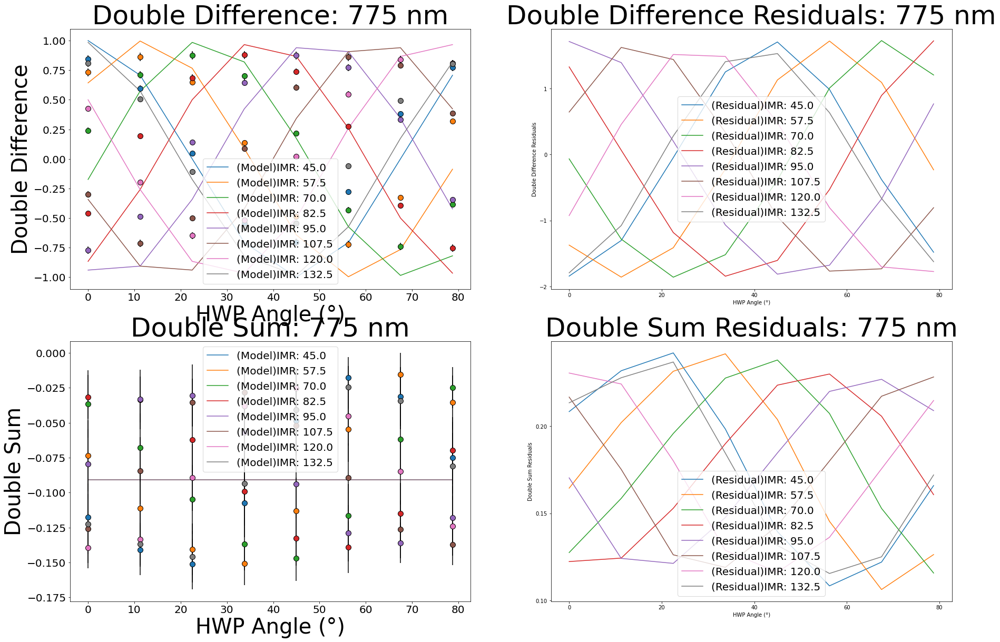

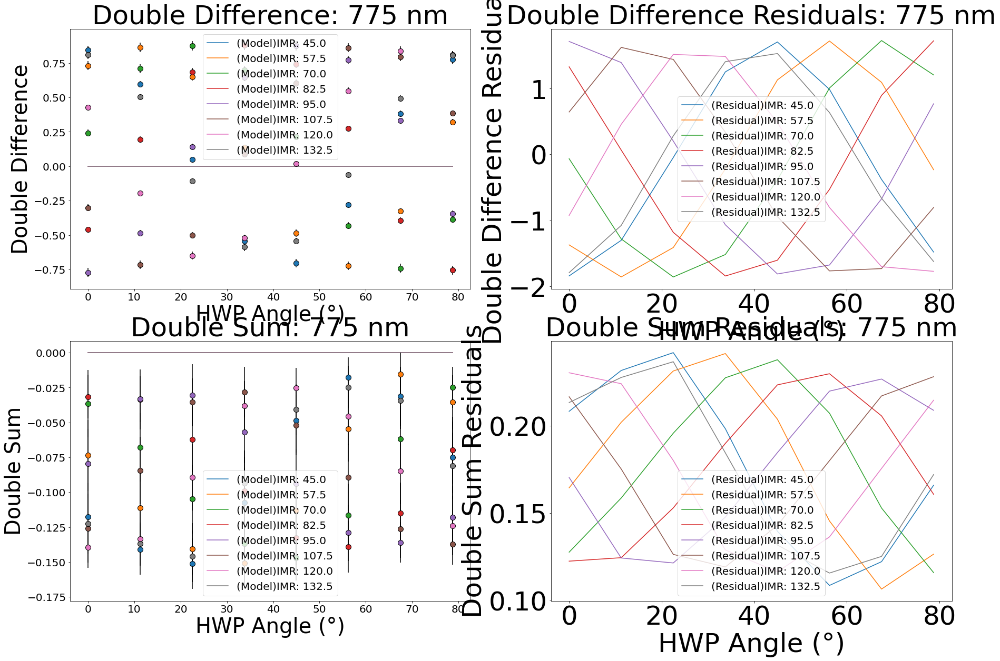

In [5]:
# Small value to remove error bars
log_f = -10

# Defining model angles
model_angles = np.linspace(0, 90, 100)

# Choosing matrix model
model = instrument_matrices.full_system_mueller_matrix

# Based on values in Six_And_Eleven_Parameter_Model_Best_MCMC_and_Scipy_Fits - having zeros for angles that're too large
theta_pol = 0
delta_m3 = 0 # (waves) - assumed to be a perfect mirror for now
epsilon_m3 = 0  # Using the M3 diattenuation from :all_unpolarized_standards_matrix_inversion_m3_diatttenuation"
offset_m3 = 0  # NOTE: Made this zero too for testing purposes
em_gain = 1.2  # Add your actual em_gain value
delta_HWP = 0.5  # Add your actual delta_HWP value
offset_HWP = 0  # Add your actual offset_HWP value
delta_derot = 0.497  # Add your actual delta_derot value
offset_derot = 0  # Add your actual offset_derot value
delta_opts = 0  # Add your actual delta_opts value
epsilon_opts = 0  # Add your actual epsilon_opts value
rot_opts = 0  # Add your actual rot_opts value
delta_FLC = 0.5  # Add your actual delta_FLC value
rot_FLC = 0  # Add your actual rot_FLC value

initial_guess = np.array([ \
    theta_pol,
    delta_HWP,
    offset_HWP,
    delta_derot,
    offset_derot,
    delta_opts,
    epsilon_opts,
    rot_opts,
    delta_FLC,
    rot_FLC,
    em_gain
])

fixed_params = [delta_m3, epsilon_m3, offset_m3, delta_HWP, offset_HWP, 
    delta_derot, offset_derot, delta_opts, epsilon_opts, rot_opts, delta_FLC, 
    rot_FLC, em_gain]

# Calculating initial model and residuals
initial_model = instrument_matrices.internal_calibration_mueller_matrix(theta_pol,
    model, fixed_params, HWP_angs, IMR_angs)
initial_residuals = initial_model - reshaped_data

# Plotting the initial model and residuals
data_plotting.plot_single_model_and_residuals(angles, angles, -initial_model, data, 
    initial_residuals, stds, log_f, wavelength, fig_dimensions = (30, 20))

# Plotting just the data with no model
data_plotting.plot_single_model_and_residuals(angles, angles, np.zeros(np.shape(initial_model)), data, 
    initial_residuals, stds, log_f, wavelength, fig_dimensions = (30, 20))

# FLC ~ HWP behaviour and FLC angle restrained from -5 to 5 degrees, HWP and IMR basically restrained

Initial Likelihood: 10676.85778468533
Iteration #1: -14113.651941561831
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): 2.5393591009501666
delta_HWP (waves): 0.47611198598606164
offset_HWP (degrees): 2.9979791974862593
delta_derot (waves): 0.500696668357939
offset_derot (degrees): -4.590021474210241
delta_opts (waves): 0.07210978779458727
epsilon_opts: 0.0
rot_opts (degrees): -37.435476878699774
delta_FLC (waves): 0.426486617828189
rot_FLC (degrees): -1.836245518018373
em_gain: 1.1428794857170925


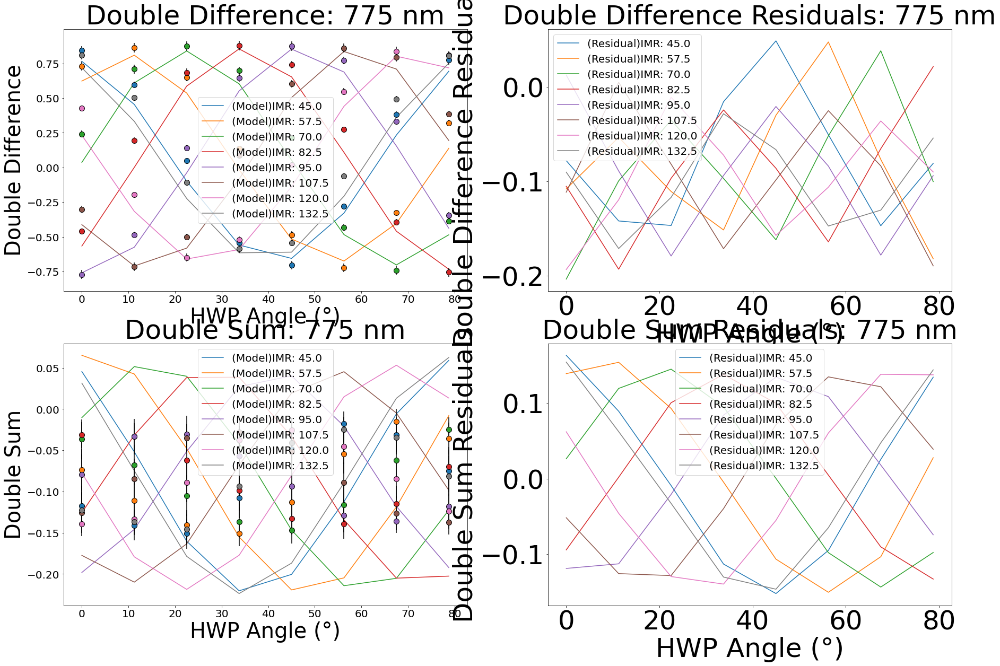

Post Likelihood: -14113.651941561831
Initial Likelihood: 3420.798398458611
Iteration #2: -11918.953795652844
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): 0.9175673826921562
delta_HWP (waves): 0.4750001561946302
offset_HWP (degrees): 4.6131631375857864
delta_derot (waves): 0.5013944459266169
offset_derot (degrees): 3.797496376198401
delta_opts (waves): 0.21176452776127086
epsilon_opts: 0.0005461748400722233
rot_opts (degrees): -75.23447703215675
delta_FLC (waves): 0.5231203267032469
rot_FLC (degrees): -3.964009171618768
em_gain: 1.1889631370918279


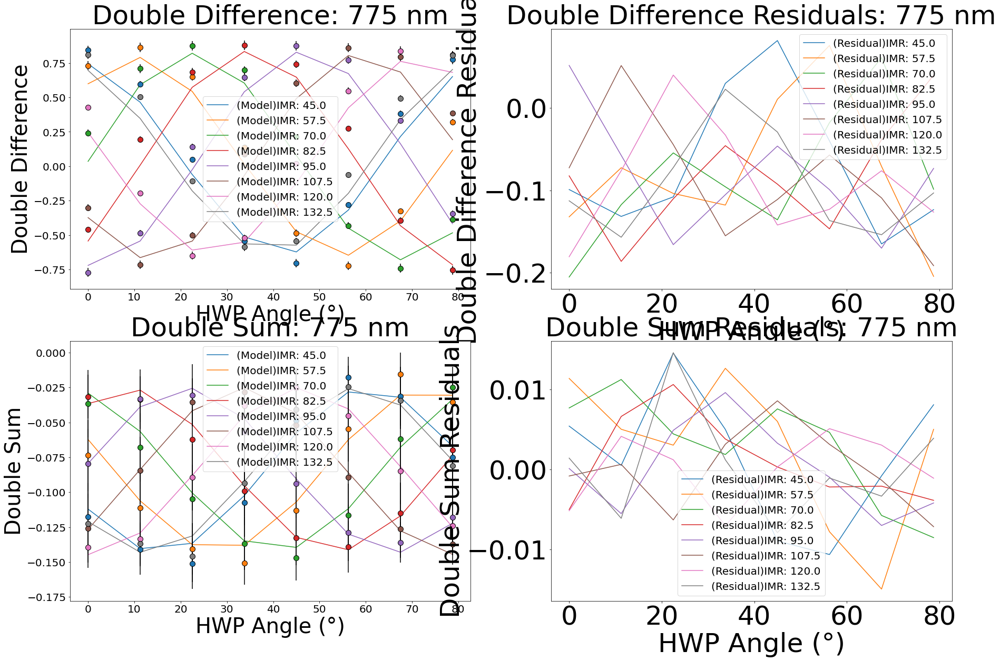

Post Likelihood: -11918.953795652844
Initial Likelihood: 1697.1781963667495
Iteration #3: -6831.394986735051
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.475000516255514
offset_HWP (degrees): -1.7214291528332968
delta_derot (waves): 0.5021758403045822
offset_derot (degrees): 0.22368313116047378
delta_opts (waves): 0.23039022528133757
epsilon_opts: 0.09997997630905364
rot_opts (degrees): -79.27605156598673
delta_FLC (waves): 0.5226403172859984
rot_FLC (degrees): -4.512052414337553
em_gain: 1.1858401073970786


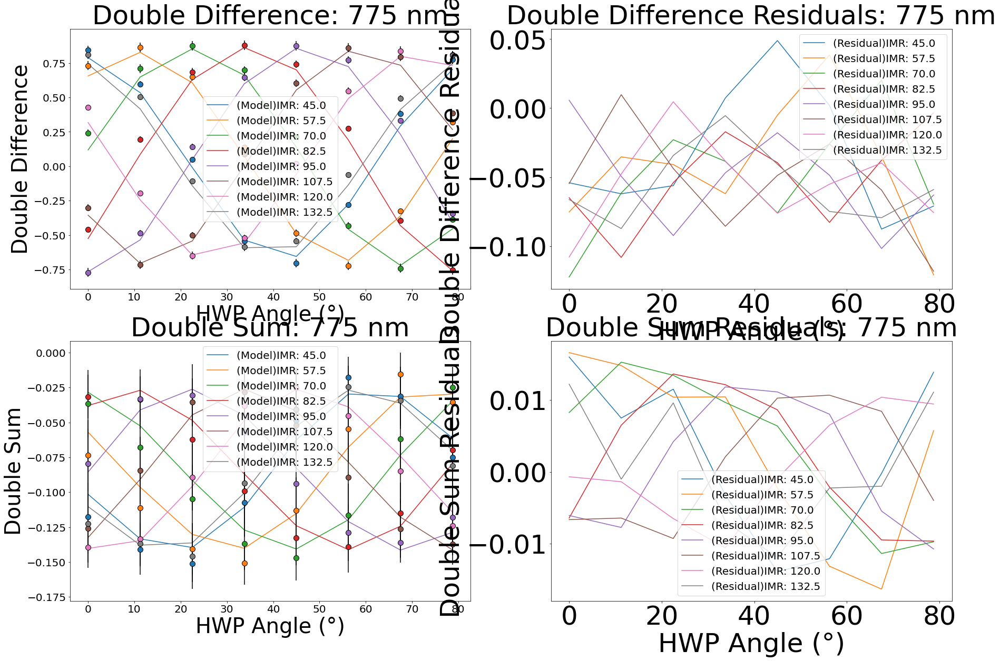

Post Likelihood: -6831.394986735051
Initial Likelihood: 561.4941576536962
Iteration #4: -6893.641476857766
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.47500001471953535
offset_HWP (degrees): -1.2498920501423718
delta_derot (waves): 0.501689725804473
offset_derot (degrees): 4.997495715565666
delta_opts (waves): 0.2271888301627153
epsilon_opts: 0.0999750758971398
rot_opts (degrees): -70.86377850241743
delta_FLC (waves): 0.5196195322920323
rot_FLC (degrees): -0.31052826506571773
em_gain: 1.1873003728570084


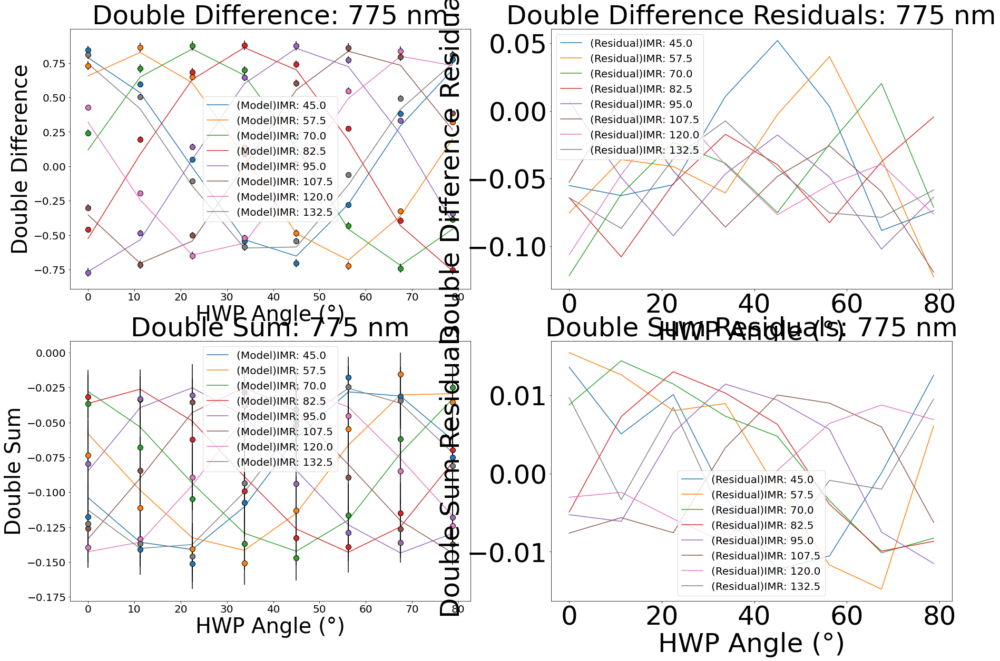

Post Likelihood: -6893.641476857766
Initial Likelihood: 560.1316056194635
Iteration #5: -6878.946123306751
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.47500000025096933
offset_HWP (degrees): -1.1832273258496988
delta_derot (waves): 0.5016850091263776
offset_derot (degrees): 4.999996552617981
delta_opts (waves): 0.22765394187057564
epsilon_opts: 0.09999999944233334
rot_opts (degrees): -71.05250804323009
delta_FLC (waves): 0.5196693831608226
rot_FLC (degrees): -0.3948927465900183
em_gain: 1.187062955327348


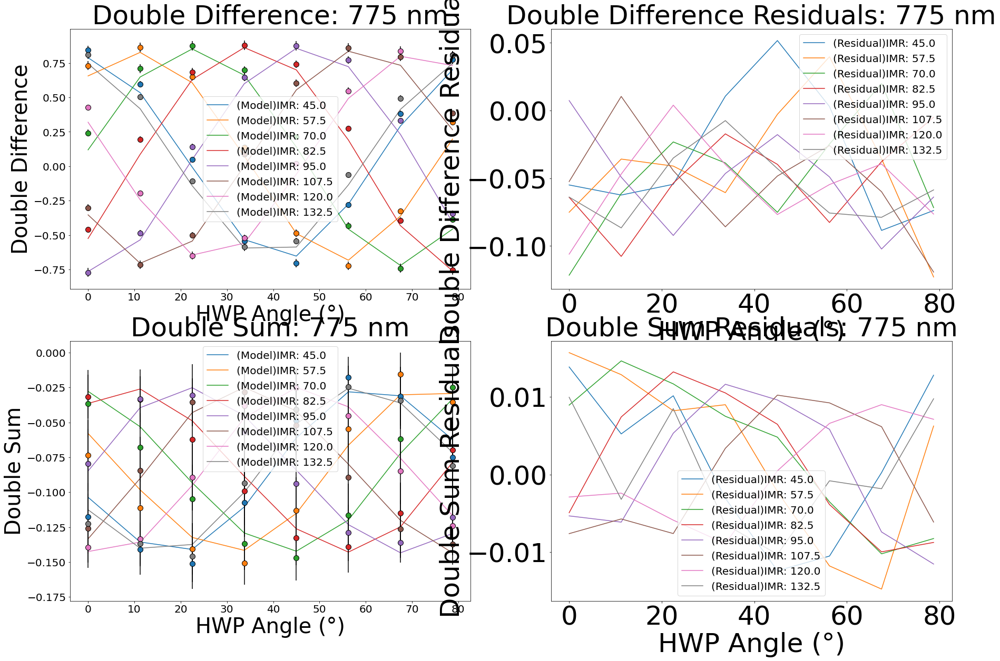

Post Likelihood: -6878.946123306751
Initial Likelihood: 559.9076546986471
Iteration #6: -6878.977419196645
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.47500000025094413
offset_HWP (degrees): -1.1832140096934167
delta_derot (waves): 0.5016830516608195
offset_derot (degrees): 4.999999831290447
delta_opts (waves): 0.2276527689916779
epsilon_opts: 0.1
rot_opts (degrees): -71.052227990164
delta_FLC (waves): 0.5196691863685234
rot_FLC (degrees): -0.3949297862700534
em_gain: 1.1870661853075304


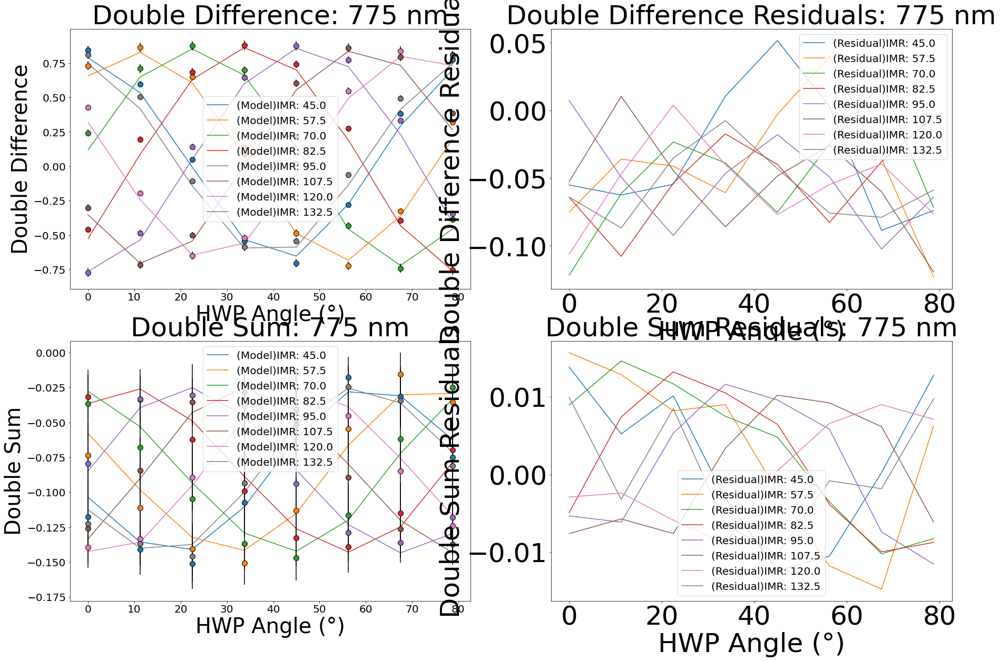

Post Likelihood: -6878.977419196645
Initial Likelihood: 559.9076438269606
Iteration #7: -6878.938287139123
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.4750000002541459
offset_HWP (degrees): -1.181401276534305
delta_derot (waves): 0.5016829649164345
offset_derot (degrees): 4.999999924783582
delta_opts (waves): 0.22765324822662414
epsilon_opts: 0.09999999999666628
rot_opts (degrees): -71.05561539261171
delta_FLC (waves): 0.5196701656487526
rot_FLC (degrees): -0.39665758308756216
em_gain: 1.1870660746597288


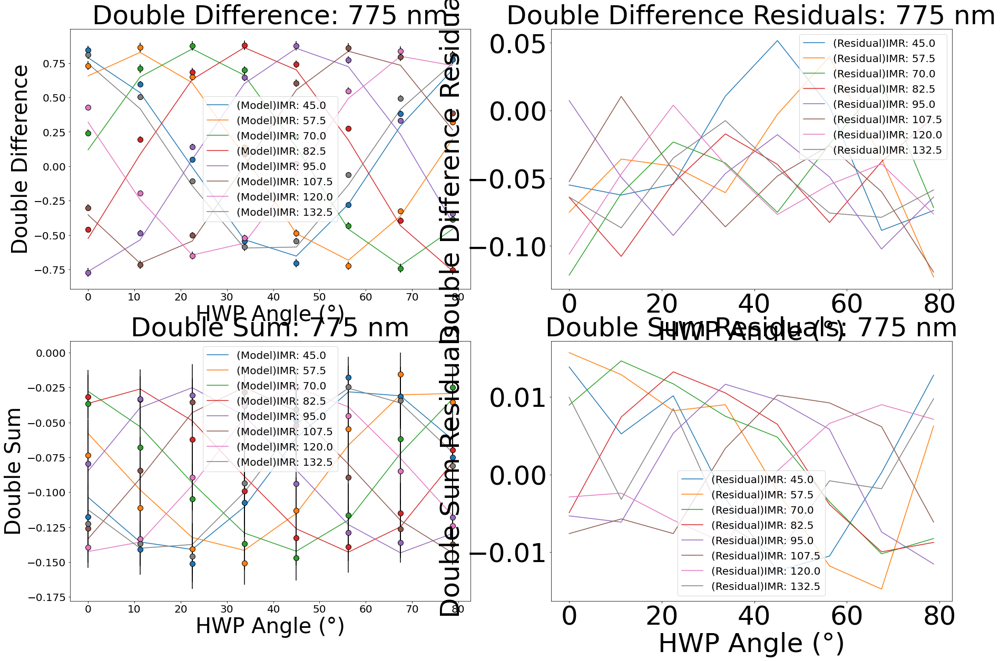

Post Likelihood: -6878.938287139123
Initial Likelihood: 559.9076392344447
Iteration #8: -6878.925118285308
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.475000000254176
offset_HWP (degrees): -1.1813519625975077
delta_derot (waves): 0.5016830956969702
offset_derot (degrees): 4.999999938770724
delta_opts (waves): 0.22765309105494913
epsilon_opts: 0.09999999999797171
rot_opts (degrees): -71.05570923687804
delta_FLC (waves): 0.5196700538789518
rot_FLC (degrees): -0.3967039709721378
em_gain: 1.1870658039536566


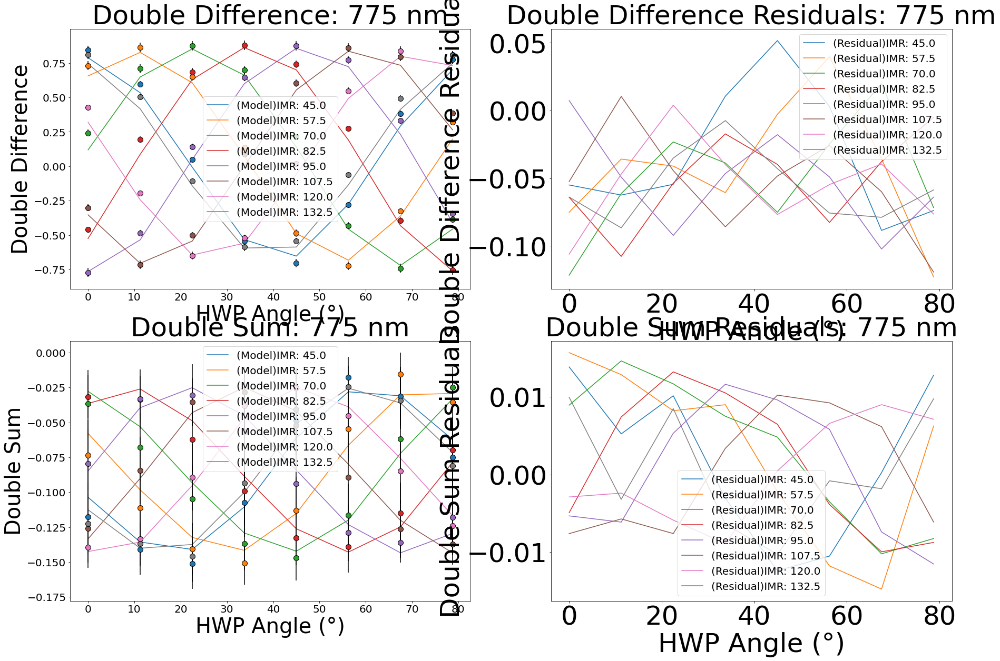

Post Likelihood: -6878.925118285308
Initial Likelihood: 559.9076392255736
Iteration #9: -6878.982112963547
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.47500000025419375
offset_HWP (degrees): -1.1813127084110535
delta_derot (waves): 0.5016830531648742
offset_derot (degrees): 4.999999961385871
delta_opts (waves): 0.22765250150771468
epsilon_opts: 0.09999999999931786
rot_opts (degrees): -71.05567524775275
delta_FLC (waves): 0.5196701460381259
rot_FLC (degrees): -0.3967021140565349
em_gain: 1.1870667261070347


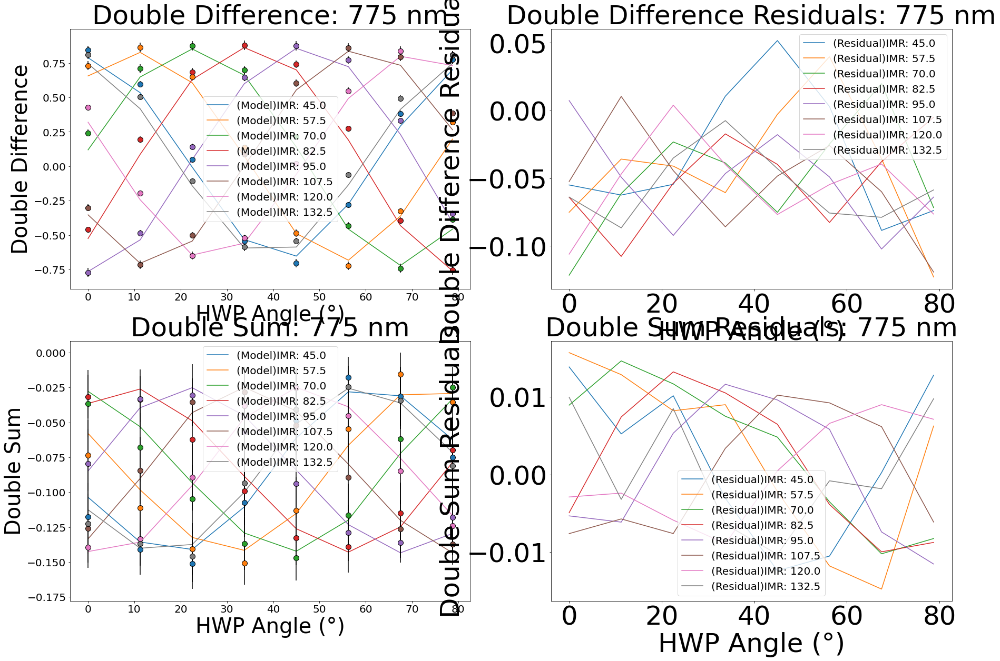

Post Likelihood: -6878.982112963547
Initial Likelihood: 559.907639217848
Iteration #10: -6878.969432389836
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.4750000002541872
offset_HWP (degrees): -1.1813194125477497
delta_derot (waves): 0.5016830781713388
offset_derot (degrees): 4.999999986478425
delta_opts (waves): 0.22765319808791598
epsilon_opts: 0.09999999999892903
rot_opts (degrees): -71.05575954931498
delta_FLC (waves): 0.5196702480584418
rot_FLC (degrees): -0.3967299421051478
em_gain: 1.1870664642733246


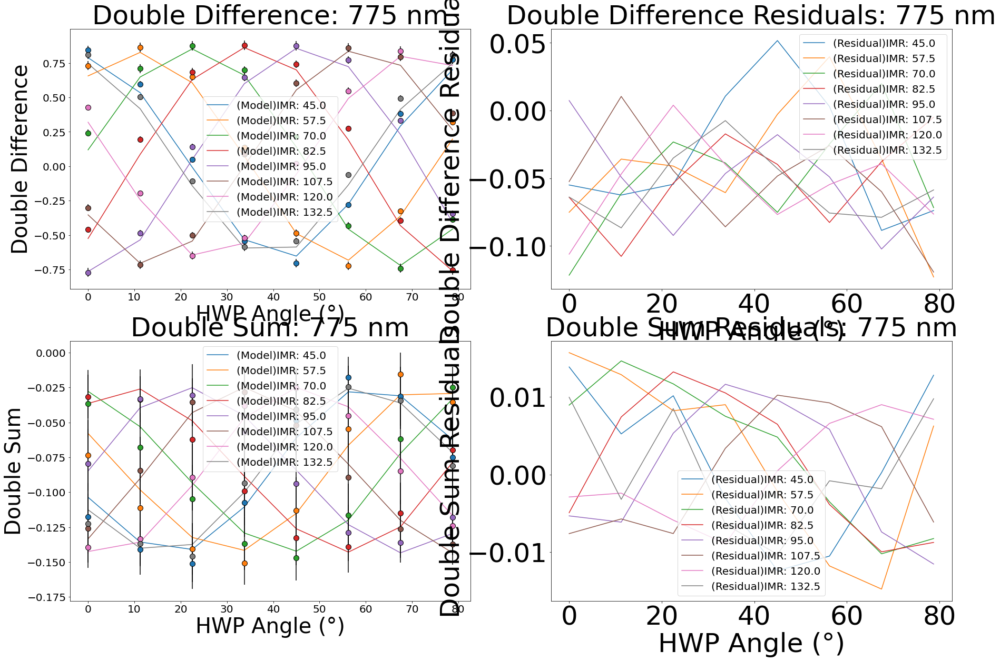

Post Likelihood: -6878.969432389836
Initial Likelihood: 559.9076392148518
Iteration #11: -6878.912489888286
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.475000000254189
offset_HWP (degrees): -1.18129410049933
delta_derot (waves): 0.5016829534827639
offset_derot (degrees): 4.99999997408182
delta_opts (waves): 0.2276531524509925
epsilon_opts: 0.09999999999710772
rot_opts (degrees): -71.0557824973183
delta_FLC (waves): 0.5196701982248264
rot_FLC (degrees): -0.3967505326230474
em_gain: 1.1870657975632135


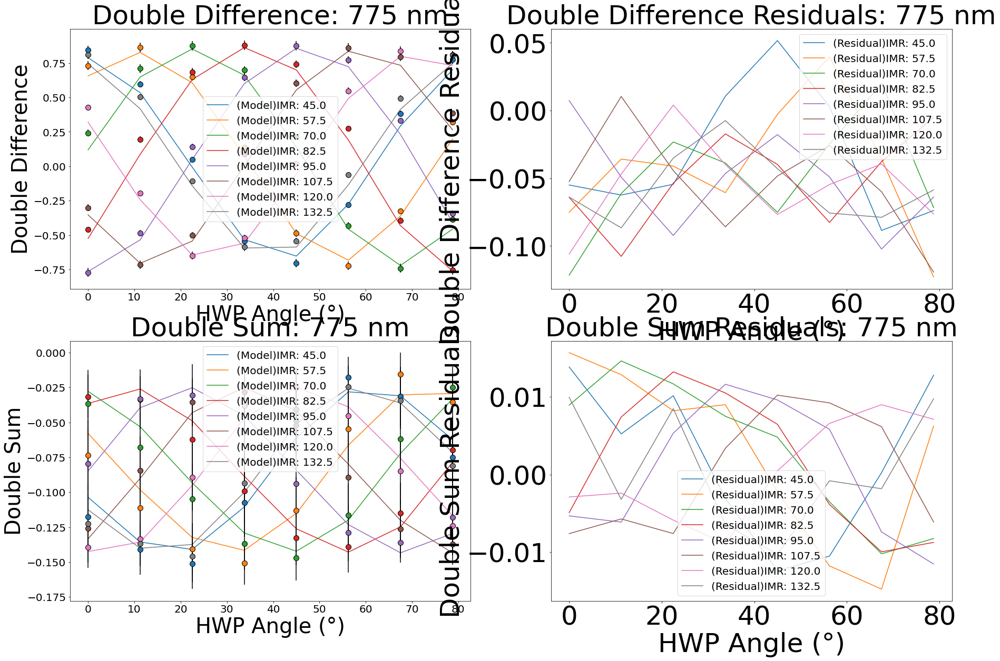

Post Likelihood: -6878.912489888286
Initial Likelihood: 559.9076392124836
Iteration #12: -6878.903645436497
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.4750000002542711
offset_HWP (degrees): -1.1812569043338597
delta_derot (waves): 0.5016829512435821
offset_derot (degrees): 4.999999989920184
delta_opts (waves): 0.2276533793485921
epsilon_opts: 0.09999999999851927
rot_opts (degrees): -71.05588151978655
delta_FLC (waves): 0.5196702734411869
rot_FLC (degrees): -0.3967903030558824
em_gain: 1.1870655869197897


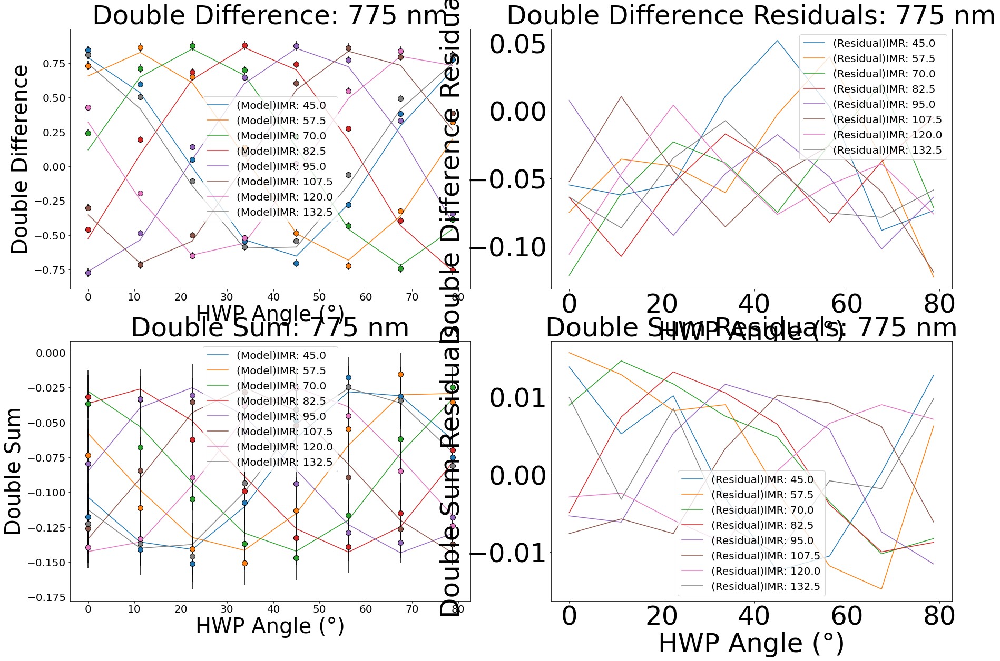

Post Likelihood: -6878.903645436497
Initial Likelihood: 559.9076392087845
Iteration #13: -6878.909327177058
MAXIMUM LIKELIHOOD ESTIMATES

theta_pol (degrees): -5.0
delta_HWP (waves): 0.47500000025431866
offset_HWP (degrees): -1.1812353785297531
delta_derot (waves): 0.5016830503215788
offset_derot (degrees): 4.999999993931285
delta_opts (waves): 0.22765316365394714
epsilon_opts: 0.09999999999900783
rot_opts (degrees): -71.05591558076577
delta_FLC (waves): 0.5196702098178974
rot_FLC (degrees): -0.3968107770732079
em_gain: 1.1870656435389602


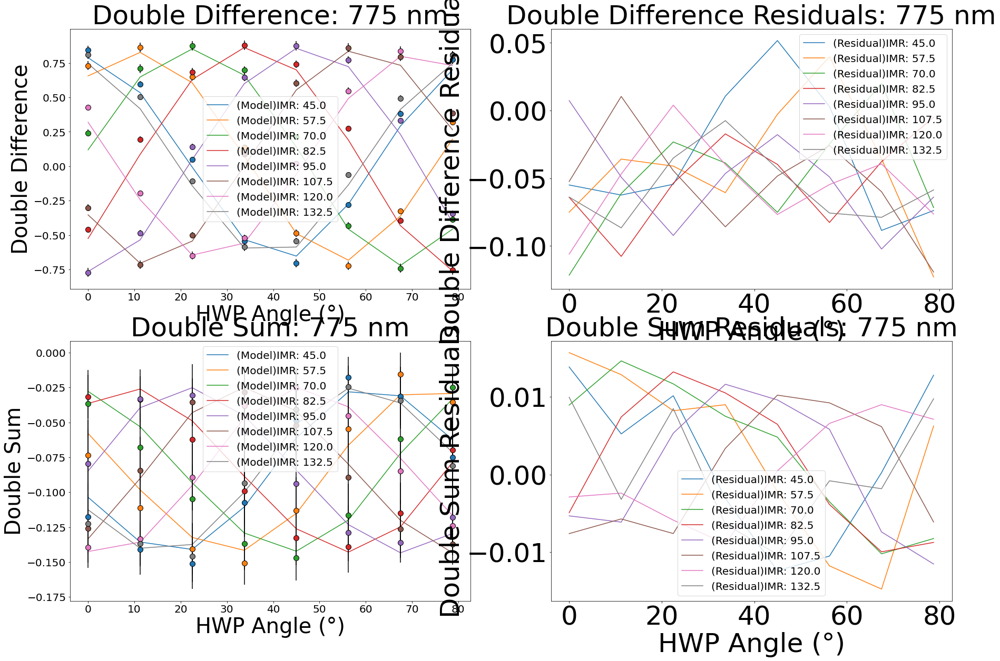

Post Likelihood: -6878.909327177058
Initial Likelihood: 559.9076392018028


In [6]:
import numpy as np
from scipy.optimize import minimize

# Small value to remove error bars
log_f = -10

# Defining model angles
model_angles = np.linspace(0, 90, 100)

# List to store all the solutions 
solns = []

# Initial guess based on the parameters you want to minimize
initial_guess = np.array([theta_pol, delta_HWP, offset_HWP, delta_derot, offset_derot, 
    delta_opts, epsilon_opts, rot_opts, delta_FLC, rot_FLC, em_gain])

all_params = [delta_m3, epsilon_m3, offset_m3, delta_HWP, offset_HWP, 
    delta_derot, offset_derot, delta_opts, epsilon_opts, rot_opts, delta_FLC, 
    rot_FLC, em_gain]

# Fixed parameters not included in the fitting process
fixed_params = [delta_m3, epsilon_m3, offset_m3]

# Define the bounds for the parameters (including em_gain)
bounds = [
    (-5, 5),  # theta_pol
    (delta_HWP - delta_HWP * 0.05, 0.5),  # delta_HWP
    (-5, 5),  # offset_HWP
    (delta_derot - delta_derot * 0.05, delta_derot + delta_derot * 0.05),  # delta_derot
    (-5, 5),  # offset_derot
    (-0.5, 0.5),  # delta_opts
    (0, 0.1),  # epsilon_opts
    (-90, 90),  # rot_opts
    (0.4, 0.6),  # delta_FLC
    (-5, 5),  # rot_FLC
    (0, 2)  # em_gain
]

# Defining the negative log-likelihood function
def nll(params, model, HWP_angs, IMR_angs, data, stds):
    theta_pol, delta_HWP, offset_HWP, delta_derot, offset_derot, delta_opts, epsilon_opts, rot_opts, delta_FLC, rot_FLC, em_gain = params
    delta_m3, epsilon_m3, offset_m3 = fixed_params
    all_params = [delta_m3, epsilon_m3, offset_m3, delta_HWP, offset_HWP, 
        delta_derot, offset_derot, delta_opts, epsilon_opts, rot_opts, delta_FLC, 
        rot_FLC, em_gain]
    this_model = -instrument_matrices.internal_calibration_mueller_matrix(theta_pol, model, all_params, HWP_angs, IMR_angs)
    residuals = this_model - data
    
    # Debug print shapes
    # print("Model shape:", this_model.shape)
    # print("Data shape:", data.shape)
    # print("Stds shape:", stds.shape)
    
    likelihood = np.sum((residuals / stds) ** 2)
    return likelihood

# Initialize variables for the iterative minimization process
counter = 0
initial_likelihood = 100
post_likelihood = 90

# Starting off with the initial guess
model = instrument_matrices.full_system_mueller_matrix
initial_model = -instrument_matrices.internal_calibration_mueller_matrix(initial_guess[0], model, all_params, HWP_angs, IMR_angs)

while post_likelihood < (initial_likelihood - 1e-6):  # Introduce a small tolerance for convergence

    counter += 1

    initial_likelihood = post_likelihood

    # Calculate the initial model and residuals
    initial_model = -instrument_matrices.internal_calibration_mueller_matrix(initial_guess[0], model, all_params, HWP_angs, IMR_angs)
    initial_residuals = initial_model - reshaped_data

    initial_likelihood = np.sum((initial_residuals / reshaped_stds) ** 2)

    print("Initial Likelihood: " + str(initial_likelihood))

    # Minimize the negative log-likelihood
    minimize_args = (model, HWP_angs, IMR_angs, reshaped_data, reshaped_stds)
    soln = minimize(nll, initial_guess, args=minimize_args, bounds=bounds, method="Nelder-Mead")

    # Save the solution
    solns.append(soln)

    # Recalculate the likelihood with the new solution
    theta_pol, delta_HWP, offset_HWP, delta_derot, offset_derot, delta_opts, epsilon_opts, rot_opts, delta_FLC, rot_FLC, em_gain = soln.x
    delta_m3, epsilon_m3, offset_m3 = fixed_params
    all_params = [delta_m3, epsilon_m3, offset_m3, delta_HWP, offset_HWP, 
        delta_derot, offset_derot, delta_opts, epsilon_opts, rot_opts, delta_FLC, 
        rot_FLC, em_gain]
    post_likelihood = np.sum((-instrument_matrices.internal_calibration_mueller_matrix(theta_pol, model, all_params, HWP_angs, IMR_angs) - reshaped_data) / reshaped_stds ** 2)

    print("Iteration #" + str(counter) + ": " + str(post_likelihood))

    print("MAXIMUM LIKELIHOOD ESTIMATES")
    print("")
    print("theta_pol (degrees): " + str(theta_pol))
    print("delta_HWP (waves): " + str(delta_HWP))
    print("offset_HWP (degrees): " + str(offset_HWP))
    print("delta_derot (waves): " + str(delta_derot))
    print("offset_derot (degrees): " + str(offset_derot))
    print("delta_opts (waves): " + str(delta_opts))
    print("epsilon_opts: " + str(epsilon_opts))
    print("rot_opts (degrees): " + str(rot_opts))
    print("delta_FLC (waves): " + str(delta_FLC))
    print("rot_FLC (degrees): " + str(rot_FLC))
    print("em_gain: " + str(em_gain))

    reshaped_data = general.reshape_and_flatten(data)
    reshaped_stds = general.reshape_and_flatten(stds)

    model_1 = -instrument_matrices.internal_calibration_mueller_matrix(theta_pol, model, all_params, HWP_angs, IMR_angs)
    residuals_1 = model_1 - reshaped_data

    data_plotting.plot_single_model_and_residuals(angles, angles, model_1, data, 
        residuals_1, stds, log_f, wavelength, fig_dimensions = (30, 20))

    # Reset initial guess
    initial_guess = soln.x

    print("Post Likelihood: " + str(post_likelihood))

print("End of Optimization")


# Saving Final Fit

In [ ]:
# import numpy as np

save_string = "scipy_minimize_20230914_" + str(wavelength) \
    + "nm_restrictive_HWP_and_IMR.npy"
np.save(save_string, soln.x)